# Import important libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [22]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler,MaxAbsScaler,RobustScaler,QuantileTransformer,PowerTransformer
from sklearn.decomposition import PCA,KernelPCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture

# Data investigation

In [3]:
path='./CC GENERAL.csv'
df = pd.read_csv(path)
print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 18)


In [4]:
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [5]:
#see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [6]:
#see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [7]:
# This will print basic statistics for numerical columns
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [8]:
print(df.duplicated())

0       False
1       False
2       False
3       False
4       False
        ...  
8945    False
8946    False
8947    False
8948    False
8949    False
Length: 8950, dtype: bool


In [9]:
print(df.duplicated().sum())

0


In [10]:
df_copy = df.copy()

In [12]:
df_copy.dropna(axis=0,inplace=True)

In [13]:
df_copy.isnull().sum(axis=0).sort_values(ascending=False)

CUST_ID                             0
BALANCE                             0
PRC_FULL_PAYMENT                    0
MINIMUM_PAYMENTS                    0
PAYMENTS                            0
CREDIT_LIMIT                        0
PURCHASES_TRX                       0
CASH_ADVANCE_TRX                    0
CASH_ADVANCE_FREQUENCY              0
PURCHASES_INSTALLMENTS_FREQUENCY    0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_FREQUENCY                 0
CASH_ADVANCE                        0
INSTALLMENTS_PURCHASES              0
ONEOFF_PURCHASES                    0
PURCHASES                           0
BALANCE_FREQUENCY                   0
TENURE                              0
dtype: int64

In [14]:
Cust_id = df['CUST_ID']
df_copy.drop('CUST_ID', axis=1, inplace=True)

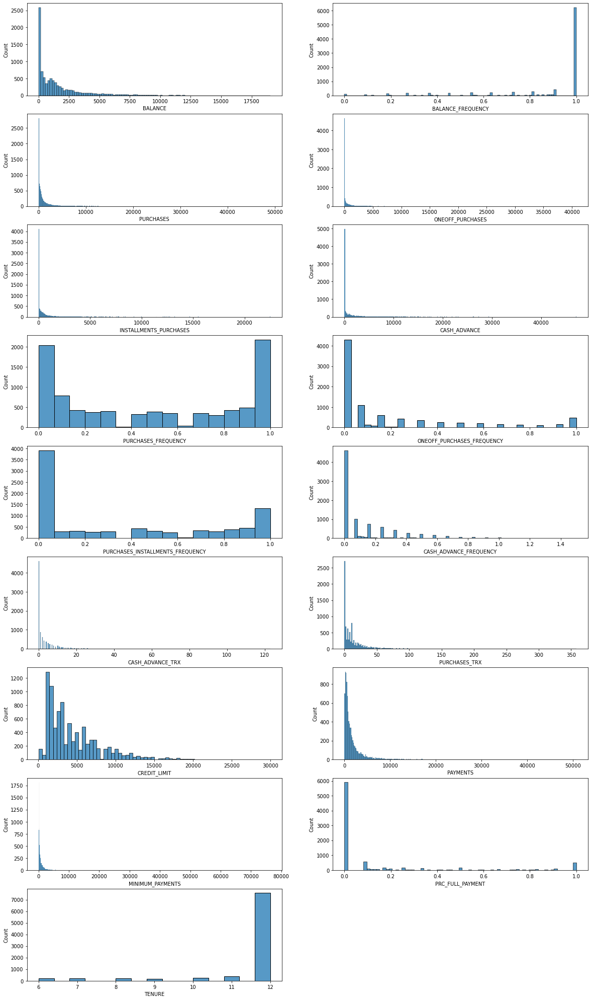

In [15]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_copy.columns):
    ax = plt.subplot(15,2,i+1)
    sns.histplot(df[col], ax=ax)
    plt.xlabel(col)    
plt.show()

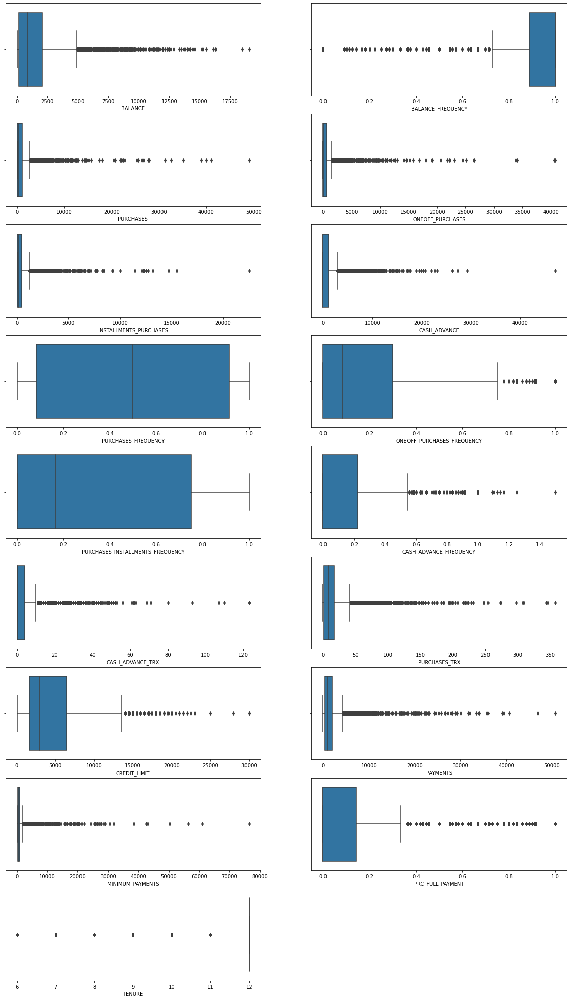

In [16]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_copy.columns):
    ax = plt.subplot(15,2,i+1)
    sns.boxplot(df[col])
    plt.xlabel(col)    
plt.show()

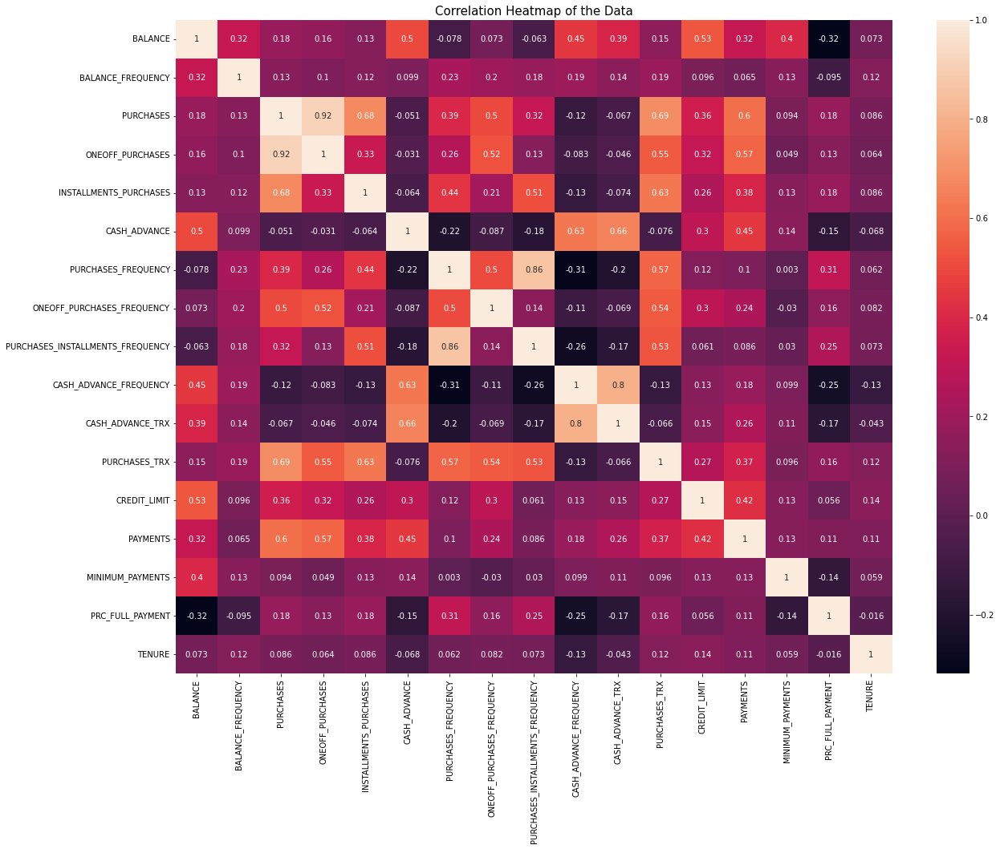

In [17]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(), annot = True)
plt.title('Correlation Heatmap of the Data', fontsize = 15)
plt.show()

In [18]:
col_names = df_copy.columns.tolist()

In [19]:
col_names

['BALANCE',
 'BALANCE_FREQUENCY',
 'PURCHASES',
 'ONEOFF_PURCHASES',
 'INSTALLMENTS_PURCHASES',
 'CASH_ADVANCE',
 'PURCHASES_FREQUENCY',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
 'CASH_ADVANCE_TRX',
 'PURCHASES_TRX',
 'CREDIT_LIMIT',
 'PAYMENTS',
 'MINIMUM_PAYMENTS',
 'PRC_FULL_PAYMENT',
 'TENURE']

# TSNE

In [20]:
def Tsne(n_components,data):
    t_sne  = TSNE(
        n_components=n_components,
        learning_rate="auto",
        method='barnes_hut', 
        n_jobs=-1, 
        perplexity=30,
        n_iter=300,
        init="pca",
        random_state=42)
    tsne = t_sne.fit_transform(data)
    tsnedf = pd.DataFrame(tsne, columns=['feature1', 'feature2'])
    return tsnedf

## Data Transformation techiques

## 1. MinMax Scaler

It just scales all the data between 0 and 1. 
The formula for calculating the scaled value is  x_scaled = (x – x_min)/(x_max – x_min)

In [23]:
scaler1 = MinMaxScaler()
df_scaled1 = pd.DataFrame()
df_scaled1[col_names] = scaler1.fit_transform(df_copy.values)

In [25]:
df_scaled1.to_csv("MinMaxdf.csv")

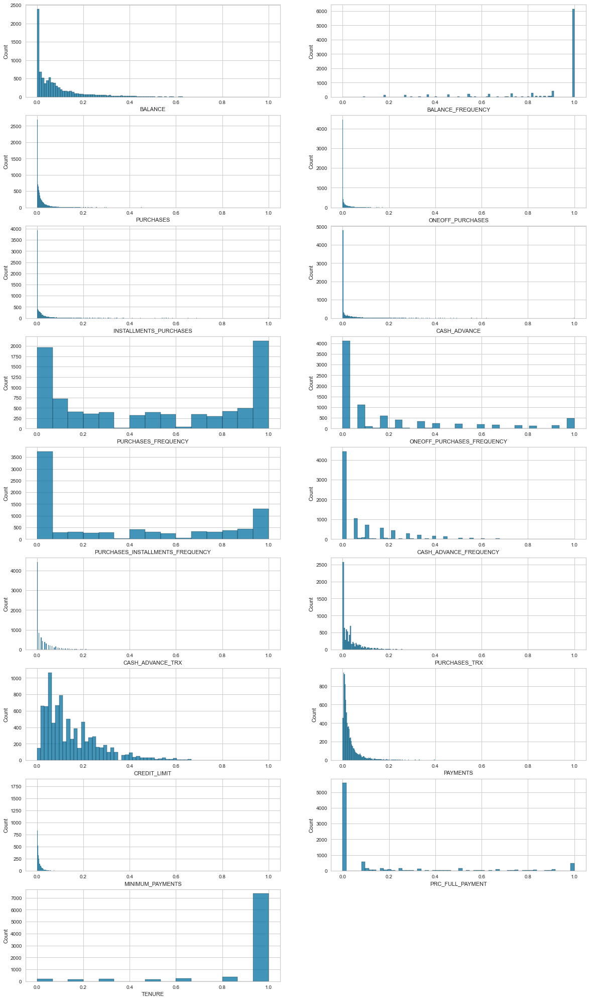

In [26]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_scaled1.columns):
    ax = plt.subplot(15,2,i+1)
    sns.histplot(df_scaled1[col], ax=ax)
    plt.xlabel(col)    
plt.show()

In [27]:
tsne_Min = Tsne(2,df_scaled1)

In [28]:
px.scatter(tsne_Min, x='feature1', y='feature2',title="T-SNE visualization for Min Max scaler")

## 2. Standar Scaler

The Standard Scaler scales the values such that the mean is 0 and the standard deviation is 1(or the variance).

x_scaled = x – mean/std_dev

In [29]:
scaler2 = StandardScaler()
df_scaled2 = pd.DataFrame()
df_scaled2[col_names] = scaler2.fit_transform(df_copy.values)

In [33]:
df_scaled2.to_csv("Standerdf.csv")

In [34]:
df_scaled2.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03,8.636000e+03
mean,-2.506872e-18,-5.691243e-15,4.031476e-16,-5.819743e-15,2.643555e-15,-4.502548e-15,-2.185028e-16,-8.273836e-15,-2.426601e-15,1.812520e-15,-6.369898e-16,-2.611357e-15,5.480666e-16,4.343960e-17,1.740219e-16,-3.688766e-15,-2.976776e-15
std,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00
min,-7.641437e-01,-4.309583e+00,-4.732082e-01,-3.591603e-01,-4.588390e-01,-4.686555e-01,-1.236139e+00,-6.862796e-01,-9.265216e-01,-6.819525e-01,-4.794369e-01,-5.970542e-01,-1.222207e+00,-6.132812e-01,-3.643042e-01,-5.377269e-01,-4.221800e+00
25%,-6.934691e-01,6.767893e-02,-4.531953e-01,-3.591603e-01,-4.588390e-01,-4.686555e-01,-1.028455e+00,-6.862796e-01,-9.265216e-01,-6.819525e-01,-4.794369e-01,-5.573385e-01,-7.985975e-01,-4.694457e-01,-2.930083e-01,-5.377269e-01,3.551807e-01
50%,-3.265978e-01,5.054046e-01,-2.999696e-01,-3.324445e-01,-3.554965e-01,-4.686555e-01,9.968862e-03,-4.085365e-01,-5.078338e-01,-6.819525e-01,-4.794369e-01,-3.190448e-01,-4.159823e-01,-3.051243e-01,-2.326108e-01,-5.377269e-01,3.551807e-01
75%,2.405073e-01,5.054046e-01,5.562856e-02,-3.444604e-03,6.901931e-02,6.515234e-02,1.048393e+00,4.246962e-01,9.575697e-01,5.570222e-01,9.925796e-02,1.178270e-01,5.405558e-01,5.727990e-02,-1.635812e-02,2.485496e-02,3.551807e-01
max,8.323708e+00,5.054046e-01,2.215714e+01,2.384284e+01,2.407255e+01,2.175188e+01,1.256077e+00,2.646651e+00,1.585600e+00,6.751896e+00,1.731543e+01,1.362114e+01,6.963026e+00,1.681891e+01,3.184159e+01,2.837758e+00,3.551807e-01


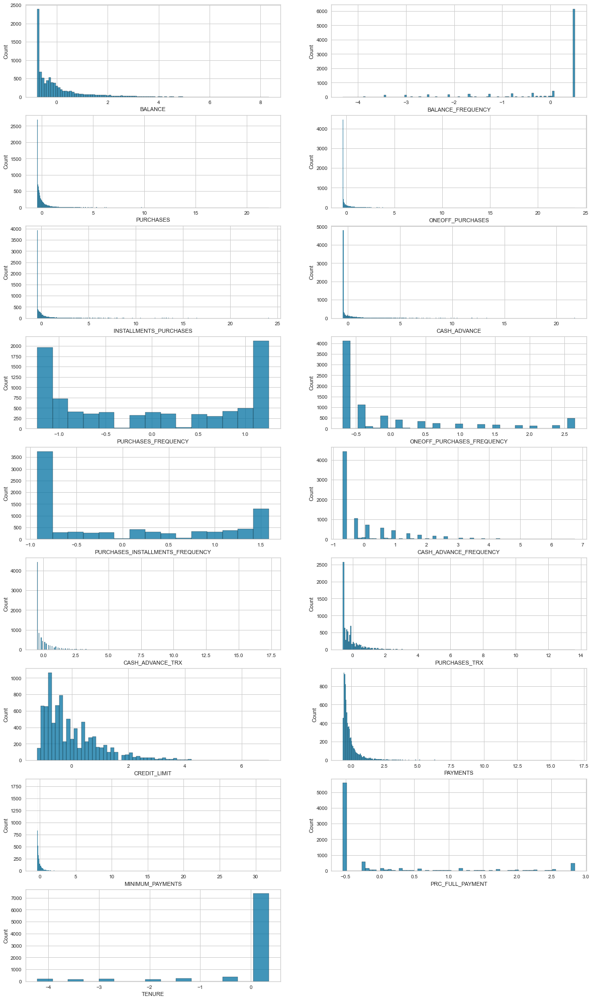

In [35]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_scaled2.columns):
    ax = plt.subplot(15,2,i+1)
    sns.histplot(df_scaled2[col], ax=ax)
    plt.xlabel(col)    
plt.show()

In [36]:
tsne_Standar = Tsne(2,df_scaled2)
px.scatter(tsne_Standar, x='feature1', y='feature2',title="T-SNE visualization for Stander scaler")

## 3. MaxAbs Scaler

The MaxAbs scaler takes the absolute maximum value of each column and divides each value in the column by the maximum value.

In [37]:
scaler3 = MaxAbsScaler()
df_scaled3 = pd.DataFrame()
df_scaled3[col_names] = scaler3.fit_transform(df_copy.values)

In [38]:
df_scaled3.to_csv("MaxAbsdf.csv")

In [39]:
df_scaled3.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8.636000e+03,8.636000e+03,8636.000000,8636.000000
mean,0.084084,0.895035,0.020910,0.014840,0.018704,0.021091,0.496000,0.205909,0.368820,0.091736,0.026942,0.041992,0.150736,3.518190e-02,1.131197e-02,0.159304,0.961199
std,0.110043,0.207697,0.044191,0.041321,0.040766,0.045006,0.401273,0.300054,0.398093,0.134528,0.056199,0.070337,0.121975,5.736839e-02,3.105201e-02,0.296271,0.109249
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001667,9.761741e-07,2.508042e-07,0.000000,0.500000
25%,0.007777,0.909091,0.000884,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,0.002793,0.053333,8.252110e-03,2.214003e-03,0.000000,1.000000
50%,0.048146,1.000000,0.007655,0.001104,0.004213,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,0.019553,0.100000,1.767842e-02,4.089357e-03,0.000000,1.000000
75%,0.110549,1.000000,0.023368,0.014698,0.021518,0.024023,0.916667,0.333333,0.750000,0.166667,0.032520,0.050279,0.216667,3.846776e-02,1.080405e-02,0.166667,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000


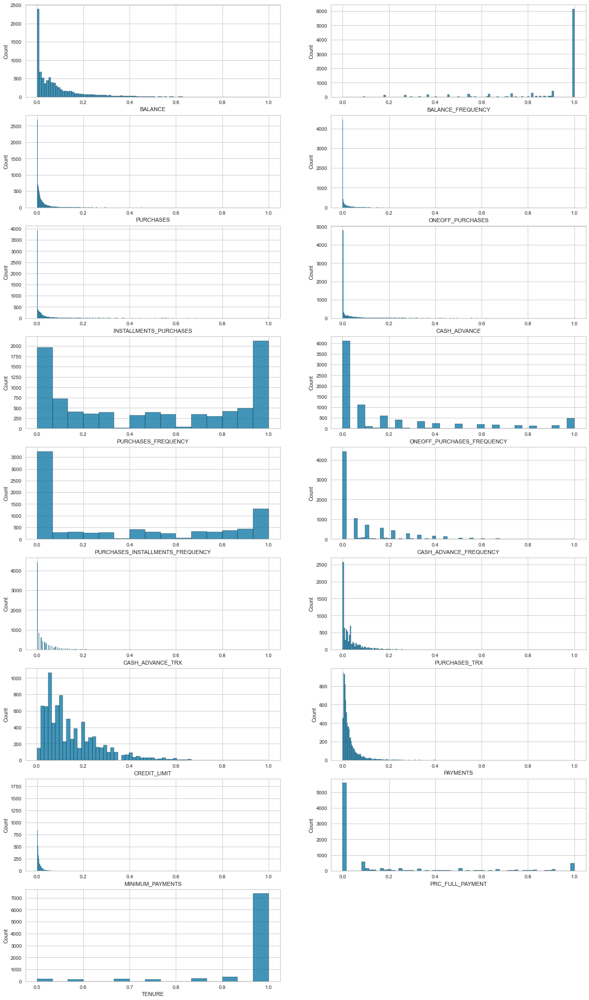

In [40]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_scaled3.columns):
    ax = plt.subplot(15,2,i+1)
    sns.histplot(df_scaled3[col], ax=ax)
    plt.xlabel(col)    
plt.show()

In [41]:
tsne_MaxAbs = Tsne(2,df_scaled3)
px.scatter(tsne_MaxAbs, x='feature1', y='feature2',title="T-SNE visualization for MAxAbs scaler")

We observe a lot of outliers in our data so using scaler not sensitive to outliers like Robusr scaler and Quantile Transformer Scaler.

### 4. Robust Scaler

The Robust Scaler is not sensitive to outliers. This scaler 
1. removes the median from the data
2. scales the data by the InterQuartile Range(IQR)

In [42]:
scaler4 = RobustScaler()
df_scaled4 = pd.DataFrame()
df_scaled4[col_names] = scaler4.fit_transform(df_copy.values)

In [43]:
df_scaled4.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8.636000e+03,8.636000e+03,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,0.349685,-1.154615,5.895352e-01,9.345793e-01,0.673469,0.877948,-0.004800,0.367728,0.269538,0.550417,0.828480,0.472543,0.310631,0.579285,0.840812,0.955820,-0.465609
std,1.070753,2.284668,1.965430e+00,2.811397e+00,1.894557,1.873442,0.481527,0.900162,0.530791,0.807166,1.728127,1.481204,0.746784,1.898632,3.614882,1.777622,1.310984
min,-0.468476,-11.000011,-3.404687e-01,-7.510432e-02,-0.195777,0.000000,-0.600000,-0.249999,-0.222223,0.000000,0.000000,-0.411765,-0.602041,-0.585043,-0.476028,0.000000,-6.000000
25%,-0.392806,-1.000000,-3.011371e-01,-7.510432e-02,-0.195777,0.000000,-0.500000,-0.249999,-0.222223,0.000000,0.000000,-0.352941,-0.285714,-0.311968,-0.218317,0.000000,0.000000
50%,0.000000,0.000000,2.577691e-17,-5.930925e-18,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.607194,0.000000,6.988629e-01,9.248957e-01,0.804223,1.000000,0.500000,0.750001,0.777777,1.000000,1.000000,0.647059,0.714286,0.688032,0.781683,1.000000,0.000000
max,9.261804,0.000000,4.413533e+01,6.796237e+01,46.277663,41.626471,0.600000,2.750004,1.111111,6.000000,30.750000,20.647059,5.510204,32.510352,115.937740,5.999988,0.000000


In [44]:
df_scaled4.to_csv("Robustdf.csv")

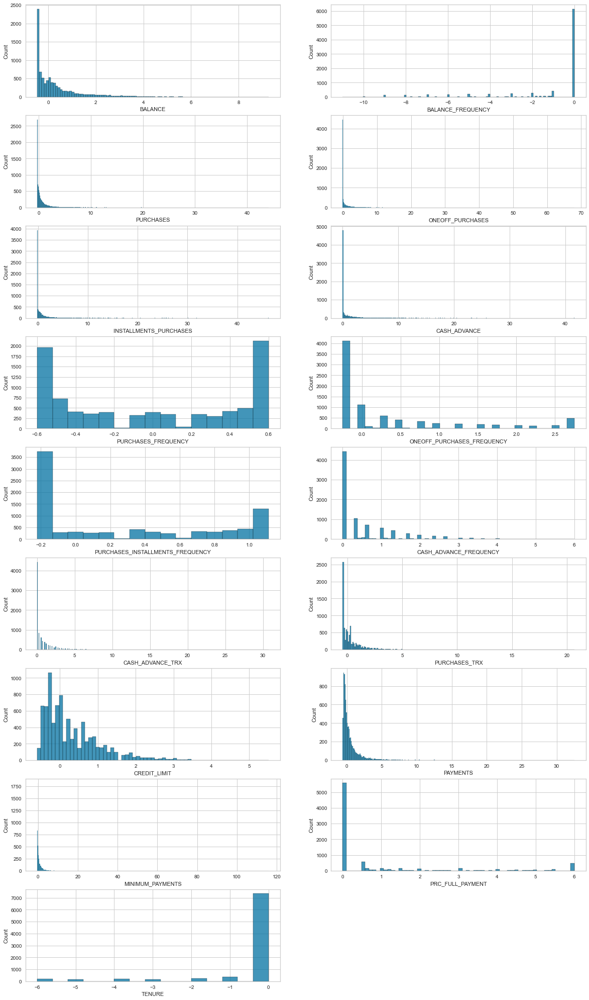

In [45]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_scaled4.columns):
    ax = plt.subplot(15,2,i+1)
    sns.histplot(df_scaled4[col], ax=ax)
    plt.xlabel(col)    
plt.show()

In [46]:
tsne_Robust = Tsne(2,df_scaled4)
px.scatter(tsne_Robust, x='feature1', y='feature2',title="T-SNE visualization for Robust scaler")

### 5. Quantile Transformer Scaler

The Quantile Transformer Scaler converts the variable distribution to a normal distribution.
and scales it accordingly.
Since it makes the variable normally distributed, it also deals with the outliers. 
Here are a few important points regarding the Quantile Transformer Scaler:
1. It computes the cumulative distribution function of the variable
2. It uses this cdf to map the values to a normal distribution
3. Maps the obtained values to the desired output distribution using the associated quantile function

In [47]:
scaler5 = QuantileTransformer()
df_scale5 =pd.DataFrame()
df_scale5[col_names] = scaler5.fit_transform(df_copy.values)
df_scale5

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.125541,0.195696,0.301614,0.000000,0.500473,0.000000,0.335836,0.000000,0.448448,0.000000,0.000000,0.317818,0.058058,0.091243,0.161568,0.000000,1.0
1,0.847617,0.266266,0.000000,0.000000,0.000000,0.973252,0.000000,0.000000,0.000000,0.778278,0.751251,0.000000,0.785786,0.904732,0.808237,0.783283,1.0
2,0.788588,1.000000,0.661346,0.787188,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.643143,0.818819,0.379384,0.682634,0.000000,1.0
3,0.472487,1.000000,0.232449,0.481392,0.000000,0.000000,0.263764,0.537538,0.000000,0.000000,0.000000,0.262763,0.129129,0.407119,0.434795,0.000000,1.0
4,0.710811,1.000000,0.783027,0.000000,0.918119,0.000000,0.592092,0.000000,0.666667,0.000000,0.000000,0.519019,0.275776,0.647467,0.935726,0.000000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,0.023759,0.083584,0.236097,0.483871,0.000000,0.000000,0.335836,0.653153,0.000000,0.000000,0.000000,0.262763,0.010010,0.010243,0.023133,0.000000,0.0
8632,0.097725,1.000000,0.448135,0.000000,0.648184,0.000000,1.000000,0.000000,0.777778,0.000000,0.000000,0.453453,0.058058,0.184533,0.027096,0.861361,0.0
8633,0.083644,0.214715,0.340049,0.000000,0.542069,0.000000,0.673674,0.000000,0.700200,0.000000,0.000000,0.418418,0.058058,0.019505,0.061803,0.793293,0.0
8634,0.050609,0.214715,0.000000,0.000000,0.000000,0.519895,0.000000,0.000000,0.000000,0.693193,0.645145,0.000000,0.010010,0.007951,0.032049,0.793293,0.0


In [49]:
df_scale5.to_csv("Quantiledf.csv")

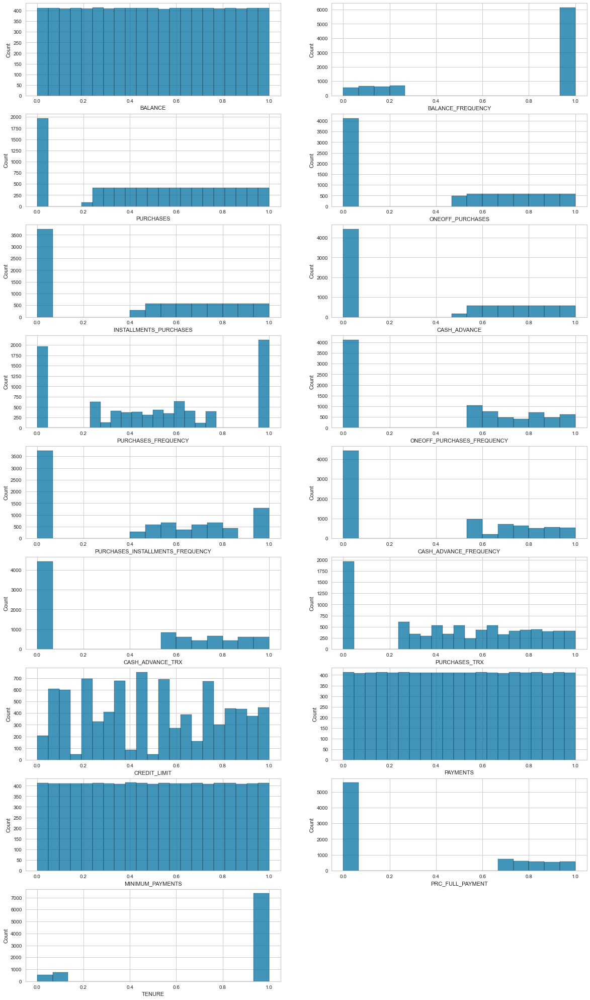

In [48]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_scale5.columns):
    ax = plt.subplot(15,2,i+1)
    sns.histplot(df_scale5[col], ax=ax)
    plt.xlabel(col)    
plt.show()

In [50]:
tsne_QT = Tsne(2,df_scale5)
px.scatter(tsne_QT, x='feature1', y='feature2',title="T-SNE visualization for Quantile Transformer scaler")

## 6. Log Transform

 It is primarily used to convert a skewed distribution to a normal distribution/less-skewed distribution.

In [51]:
df_logtran = pd.DataFrame()
df_logtran[col_names] = np.log1p(df_copy[col_names])

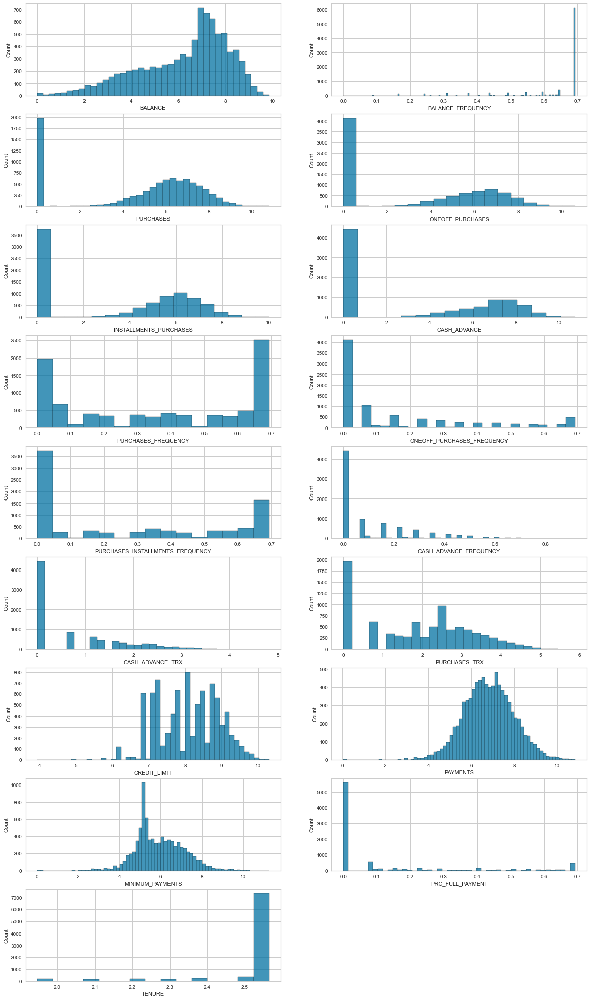

In [52]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_logtran.columns):
    ax = plt.subplot(15,2,i+1)
    sns.histplot(df_logtran[col], ax=ax)
    plt.xlabel(col)    
plt.show()

In [53]:
tsne_log = Tsne(2,df_logtran)
px.scatter(tsne_log, x='feature1', y='feature2',title="T-SNE visualization for Log Transformer scaler")

In [54]:
df_logtran.to_csv("Logdf.csv")

## 7. Power Transformer Scaler

In [55]:
powScaler = PowerTransformer(method = 'yeo-johnson')
df_powt = pd.DataFrame()
df_powt[col_names] = powScaler.fit_transform(df_copy.values)
df_powt

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-1.314140,-1.269589,-0.383149,-1.008428,0.363676,-0.951258,-0.787010,-0.909176,-0.622043,-0.888595,-0.911869,-0.591497,-1.425204,-1.290861,-0.815269,-0.693374,0.417156
1,1.038458,-0.594878,-1.508970,-1.008428,-1.092643,1.397067,-1.285866,-0.909176,-1.012022,1.102197,1.025584,-1.392628,0.914958,1.302633,0.897031,1.179060,0.417156
2,0.843014,0.612641,0.505205,1.053009,-1.092643,-0.951258,1.211921,1.724959,-1.012022,-0.888595,-0.911869,0.472489,1.002831,-0.334356,0.462236,-0.693374,0.417156
3,0.076611,0.612641,-0.916257,-0.039942,-1.092643,-0.951258,-1.030565,-0.111678,-1.012022,-0.888595,-0.911869,-0.886774,-1.216931,-0.260117,-0.327426,-0.693374,0.417156
4,0.605103,0.612641,0.794332,-1.008428,1.244506,-0.951258,0.488440,-0.909176,0.782421,-0.888595,-0.911869,0.206232,-0.745788,0.364597,1.532179,-0.693374,0.417156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,-1.841386,-1.954198,-0.847947,0.039683,-1.092643,-0.951258,-0.787010,0.421444,-1.012022,-0.888595,-0.911869,-0.886774,-2.197095,-2.318563,-1.861309,-0.693374,-2.551597
8632,-1.431517,0.612641,0.050191,-1.008428,0.731366,-0.951258,1.211921,-0.909176,1.171500,-0.888595,-0.911869,0.024046,-1.425204,-0.886449,-1.754242,1.694495,-2.551597
8633,-1.491660,-1.183290,-0.232000,-1.008428,0.499314,-0.951258,0.860252,-0.909176,0.926629,-0.888595,-0.911869,-0.087790,-1.425204,-2.050018,-1.282181,1.274110,-2.551597
8634,-1.646584,-1.183290,-1.508970,-1.008428,-1.092643,0.220540,-1.285866,-0.909176,-1.012022,0.721940,0.614599,-1.392628,-2.197095,-2.408330,-1.634683,1.274110,-2.551597


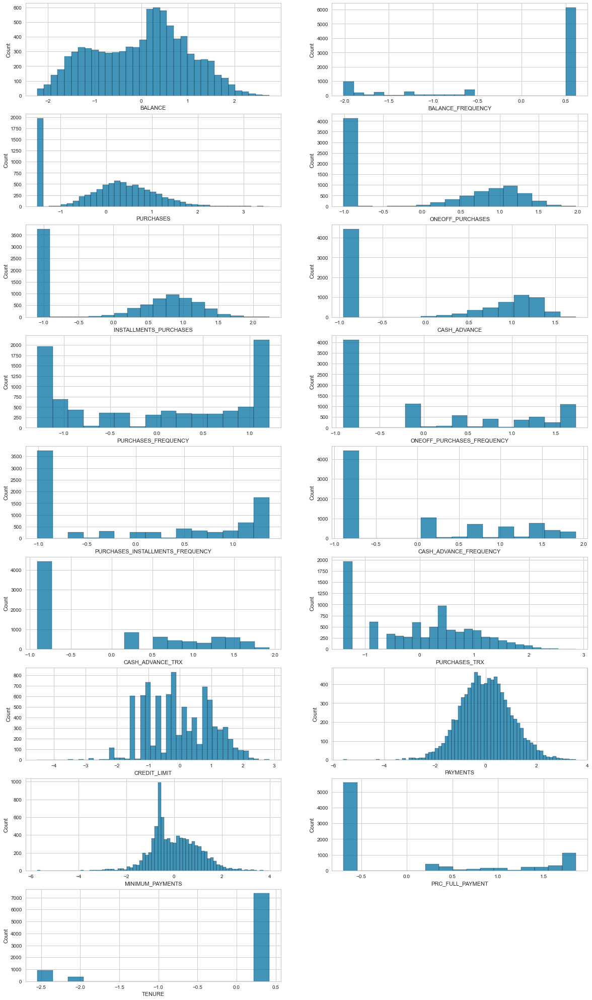

In [56]:
plt.figure(figsize=(20,60))
for i,col in enumerate(df_powt.columns):
    ax = plt.subplot(15,2,i+1)
    sns.histplot(df_powt[col], ax=ax)
    plt.xlabel(col)    
plt.show()

In [57]:
tsne_pow = Tsne(2,df_powt)
px.scatter(tsne_pow, x='feature1', y='feature2',title="T-SNE visualization for Power Transformer scaler")

In [58]:
df_logtran.to_csv("Powerdf.csv")

From above results using Log Transformer Scaler is the best choose for our data it's help with skewed problem.